> Experiments with cosine schedules and normalizations for Classifier-free Guidance.   

# Introduction

This notebook is Part 3 in a [series](https://enzokro.dev/blog/posts/2022-11-15-guidance-expts-3/) on dynamic Classifier-free Guidance. It combines normalizations and schedules for the guidance parameter $G$. 

## Quick recap of Parts 1 and 2  

In Part 1, we generated a baseline image using a constant Classifier-free Guidance. Attempting to improve on the baseline, we swept the guidance parameter $G$ over a set of Cosine Schedules.  

In Part 2, we introduced normalizations for Classifier-free Guidance. There was one kind of normalization, `Prediction Normalization`, that seems to improve the overall quality of generated images. 

## Part 3: Combining schedules and normalizations

In Part 3, we build on the previous results by now combining guidance normalizations *and* schedules.  

The goal is to find a combo of normalized schedules that universally improve the outputs of Diffusion image models.

## Leveraging a few helper libraries

We reuse our helper libraries to more efficiently run guidance experiments. The two libraries are:

- `min_diffusion`
- `cf_guidance`

They were introduced in [this separate post](https://enzokro.dev/blog/posts/2022-11-20-minimal-diffusion/).  

# Experiment Setup

## Python Imports

First we import the needed python modules.

In [ ]:
import os
import math
import random
import warnings
from PIL import Image
from typing import List
from pathlib import Path
from types import SimpleNamespace
from fastcore.all import L
from functools import partial

import numpy as np
import matplotlib.pyplot as plt

# imports for diffusion models
import torch
from transformers import logging
# for clean outputs
warnings.filterwarnings("ignore")
logging.set_verbosity_error()

# set the hardware device
device = "cuda" if torch.cuda.is_available() else "mps" if torch.has_mps else "cpu"

2022-11-24 18:34:14.079096: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


### Seed for reproducibility

We use the `seed_everything` function to make sure that the results are repeatable across notebooks. 

In [ ]:
# set the seed and pseudo random number generator
SEED = 1024
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    generator = torch.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    return generator
# for sampling the initial, noisy latents
generator = seed_everything(SEED)

## Importing the helper libraries

The `cf_guidance` library has the guidance schedules and normalizations.  

In [ ]:
# helpers to create cosine schedules
from cf_guidance.schedules  import get_cos_sched

# normalizations for classifier-free guidance
from cf_guidance.transforms import GuidanceTfm, BaseNormGuidance, TNormGuidance, FullNormGuidance

The `min_diffusion` library loads a Stable Diffusion model from the HuggingFace hub.

In [ ]:
# to load Stable Diffusion pipelines
from min_diffusion.core import MinimalDiffusion

# to plot generated images
from min_diffusion.utils import show_image, image_grid, plot_grid

# Loading the new `openjourney` model from Prompt Hero

The following code loads the `openjourney` Stable Diffusion model on the GPU, with `torch.float16` precision.

In [ ]:
model_name = 'prompthero/openjourney'
device     = 'cuda'
dtype      = torch.float16

In [ ]:
pipeline = MinimalDiffusion(model_name, device, dtype, generator=generator)

In [ ]:
pipeline.load();

Enabling default unet attention slicing.


# Text prompt for image generations

We use the familiar, running prompt in our series to generate an image:  

> "a photograph of an astronaut riding a horse"

:::: {.callout-important}  
The `openjourney` model was fine-tuned to create images in the style of [Midjourney v4](https://mezha.media/en/2022/11/11/midjourney-v4-is-an-incredible-new-version-of-the-ai-image-generator/).  

To enable this fine-tuned style, we need to add the keyword `"mdjrny-v4"` at the start of the prompt.  
::::

In [ ]:
# text prompt for image generations
prompt = "mdjrny-v4 style a photograph of an astronaut riding a horse"

## Image parameters

The images will be generated over $50$ diffusion steps. They will have a height and width of `512 x 512` pixels. 

In [ ]:
# the number of diffusion steps
num_steps = 50

# generated image dimensions
width, height = 512, 512

# Function to run the experiments

The `run` function below generates images for the text `prompt`.  

The function sweeps a given set of `schedules` using the guidance normalization `guide_tfm`. It also stores the output images with a matching title for plotting and visualizations.

In [ ]:
def run(prompt, schedules, guide_tfm=None, generator=None,
        show_each=False, test_run=False):
    """Runs a dynamic Classifier-free Guidance experiment. 
    
    Generates an image for the text `prompt` given all the values in `schedules`.
    Uses a Guidance Transformation class from the `cf_guidance` library.  
    Stores the output images with a matching title for plotting. 
    Optionally shows each image as its generated.
    If `test_run` is true, it runs a single schedule for testing. 
    """
    # store generated images and their title (the experiment name)
    images, titles = [], []
    
    # make sure we have a valid guidance transform
    assert guide_tfm
    print(f'Using Guidance Transform: {guide_tfm}')
    
    # optionally run a single test schedule
    if test_run:
        print(f'Running a single schedule for testing.')
        schedules = schedules[:1]
        
    # run all schedule experiments
    for i,s in enumerate(schedules):
        
        # parse out the title for the current run
        cur_title  = s['title']
        titles.append(cur_title)
        
        # create the guidance transformation 
        cur_sched = s['schedule']
        gtfm = guide_tfm({'g': cur_sched})
        
        print(f'Running experiment [{i+1} of {len(schedules)}]: {cur_title}...')
        img = pipeline.generate(prompt, gtfm, generator=generator)
        images.append(img)
        
        # optionally plot the image
        if show_each:
            show_image(img, scale=1)

    print('Done.')
    return {'images': images,
            'titles': titles,}

# The Baseline: Constant Guidance with $G =7.5$

Here we create the baseline image. Then we check how the normalized, scheduled guidances change the output.  

The baseline Classifier-free Guidance uses a constant update of $G = 7.5$.  

In [ ]:
# create the baseline Classifier-free Guidance
baseline_params = {'max_val': [7.5]}

# parameters we are sweeping
baselines_names = sorted(list(baseline_params))
baseline_scheds = L()

# step through each parameter
for idx,name in enumerate(baselines_names):
    # step through each of its values
    for idj,val in enumerate(baseline_params[name]):

        # create the baseline experimeent
        expt = {
            'param_name': name,
            'val': val,
            'schedule': [val for _ in range(num_steps)]
        }
        # for plotting
        expt['title'] = f'Param: "{name}", val={val}'
        
        # add to the running list of experiments
        baseline_scheds.append(expt)

We will be creating a lot of experiments, so let's put this code in a function. 

In [ ]:
def create_expts(params: dict, schedule_func) -> list:
    names = sorted(params)
    expts = []
    # step through parameter names and their values
    for i,name in enumerate(names):
        for j,val in enumerate(params[name]):
            # create the experiment
            expt = {'param_name': name,
                    'val': val,
                    'schedule': schedule_func({name: val}),}
            # name for plotting
            expt['title'] = f'Param: "{name}", val={val}'
            # add it to the experiment list
            expts.append(expt)
    return expts

In [ ]:
# create the baseline schedule with the new function
baseline_g = 7.5
baseline_params = {'max_val': [baseline_g]}
baseline_func = lambda params: [baseline_g for _ in range(num_steps)]
baseline_expts = create_expts(baseline_params, baseline_func)
    

Let's create the baseline image. The hope is that our guidance changes will improve on it.  

In [ ]:
baseline_res = run(prompt, baseline_expts, guide_tfm=GuidanceTfm)

Using Guidance Transform: <class 'cf_guidance.transforms.GuidanceTfm'>
Running experiment [1 of 1]: Param: "max_val", val=7.5...


  0%|          | 0/50 [00:00<?, ?it/s]

Done.


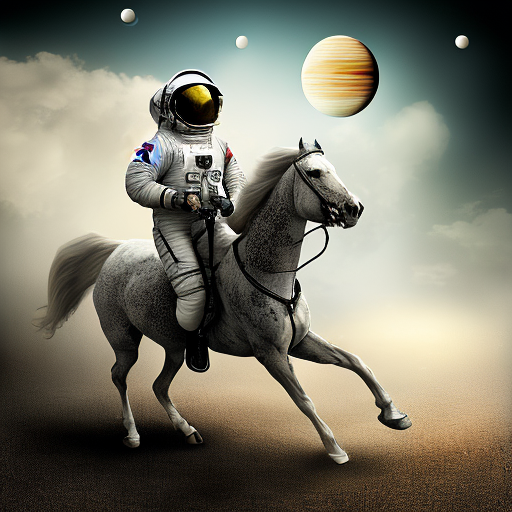

In [ ]:
# view the baseline image
baseline_res['images'][0]

# Improving the baseline with schedules and normalizations

This part is similar to its matching sections in [Part 1](https://enzokro.dev/blog/posts/2022-11-20-guidance-expts-2/#trying-to-improve-the-baseline) and [Part 2](https://enzokro.dev/blog/posts/2022-11-21-guidance-expts-3/#improving-the-baseline-with-normalizations).  

Here we create the sweep of Cosine Schedules and the normalizations.  

## Setting the schedule parameters

Recall that there are three kinds of schedules:  

1. A static schedule with a constant $G$.  
2. A decreasing Cosine schedule.  
3. A Cosine schedule with some initial warm up steps.   

We already created the static schedule `1.` in the baseline above. This section creates variations of schedules `2.` and `3.`.  

:::: {.callout-note}.  
We need smaller guidance values for `T-Normalization` and `Full Normalization`.  

These normalizations get their own, smaller value of $G_\text{small} = 0.15$. This smaller value keeps the guidance update vector $\left( t - u \right)$ from exploding in scale.  
:::: 

In [ ]:
# Default schedule parameters from the blog post
######################################
max_val           = 7.5   # guidance scaling value
min_val           = 1     # minimum guidance scaling
num_steps         = 50    # number of diffusion steps
num_warmup_steps  = 0     # number of warmup steps
warmup_init_val   = 0     # the intial warmup value
num_cycles        = 0.5   # number of cosine cycles
k_decay           = 1     # k-decay for cosine curve scaling 

# smaller values for T-Norm and FullNorm
max_T = 0.15
min_T = 0.05
######################################

To make sure our changes always reference this shared starting point, we can wrap these parameters in a dictionary.   

We also create a matching dictionary for the `T-Norm` params.

In [ ]:
DEFAULT_COS_PARAMS = {
    'max_val':           max_val,
    'num_steps':         num_steps,
    'min_val':           min_val,
    'num_cycles':        num_cycles,
    'k_decay':           k_decay,
    'num_warmup_steps':  num_warmup_steps,
    'warmup_init_val':   warmup_init_val,
}

DEFAULT_T_PARAMS = {
    'max_val':           max_T, # max G_small value
    'num_steps':         num_steps,
    'min_val':           min_T, # min G_small value
    'num_cycles':        num_cycles,
    'k_decay':           k_decay,
    'num_warmup_steps':  num_warmup_steps,
    'warmup_init_val':   warmup_init_val,
}

Every new, incremental schedule will start from these shared dictionaries. Then, a single parameter is changed at a time. 

The `cos_harness` below gives us an easy way of making these minimum-pair changes. 

In [ ]:
def cos_harness(new_params={}, default_params={}):
    '''Creates cosine schedules with updated parameters in `new_params`
    '''
    # start from the given baseline `cos_params`
    cos_params = dict(default_params)
    # update the schedule with any new parameters
    cos_params.update(new_params)
    
    # return the new cosine schedule
    sched = get_cos_sched(**cos_params)
    return sched

## Plotting the Cosine Schedules

Now we create the different Cosine schedules that will be swept. 

In [ ]:
cos_params = {
    'num_warmup_steps': [5, 10],
    'num_cycles':       [1, 1.5, 2],
    'k_decay':          [0.7, 2],
    'max_val':          [8, 10, 12],
    'min_val':          [2, 3],
}

# create the cosine experiments
cos_func  = partial(cos_harness, default_params=DEFAULT_COS_PARAMS)
cos_expts = create_expts(cos_params, cos_func)

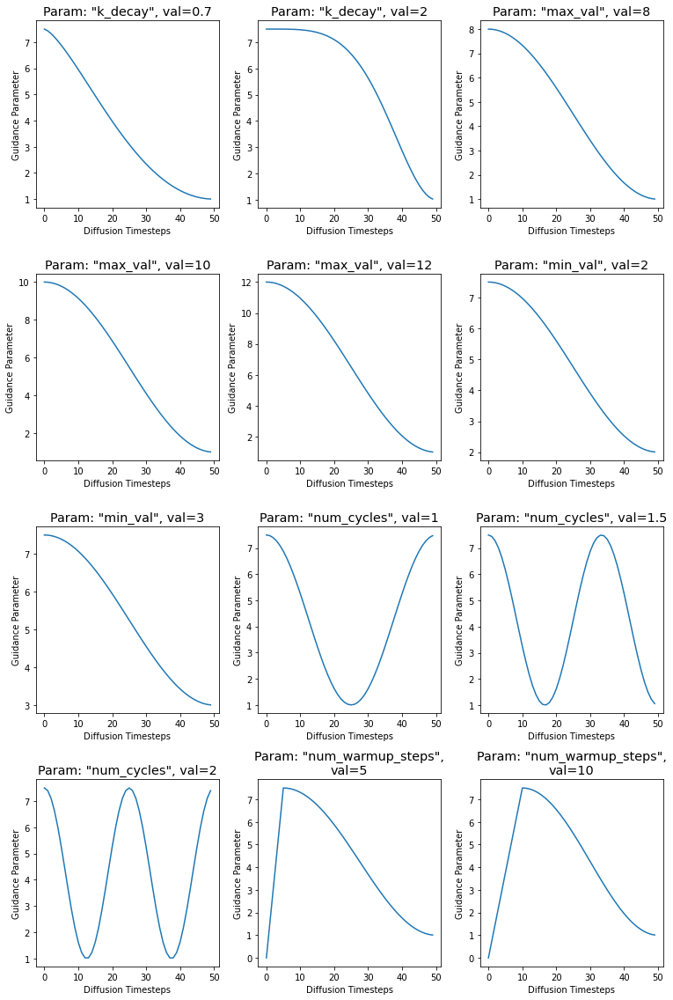

In [ ]:
plot_grid([o['schedule'] for o in cos_expts], rows=4, titles=[o['title'] for o in cos_expts])

We repeat the steps above to create the `T-Norm` experiments

In [ ]:
T_params = {
    'num_warmup_steps': [5, 10],
    'num_cycles':       [1, 1.5, 2],
    'k_decay':          [0.7, 2],
    'max_val':          [0.1, 0.2, 0.3],
    'min_val':          [0.01, 0.1],
}

# create the T-norm cosine experiments
T_func  = partial(cos_harness, default_params=DEFAULT_T_PARAMS)
T_expts = create_expts(T_params, T_func)

We also plot the `T-Norm` schedules below. Note that we are trying a few max and min values. 

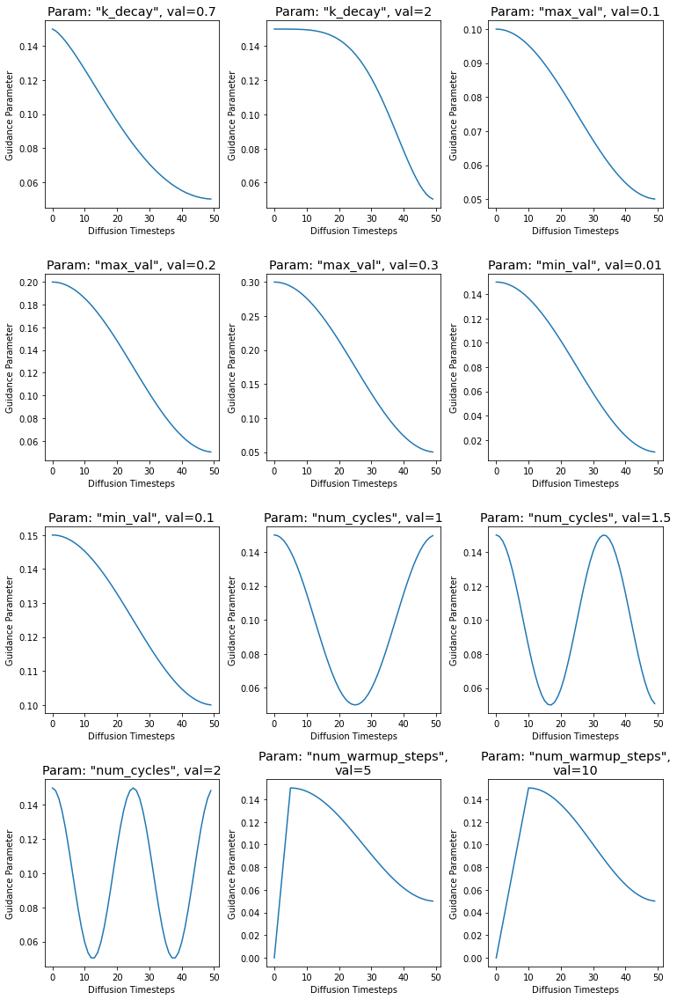

In [ ]:
plot_grid([o['schedule'] for o in T_expts], rows=4, titles=[o['title'] for o in T_expts])

## Running the normalized cosine experiments

Next we sweep the schedules for each type of normalization.

## `BaseNorm` runs

In [ ]:
print('Running the BaseNorm experiments...')
base_norm_cos_res = run(prompt, cos_expts, guide_tfm=BaseNormGuidance)

Running the BaseNorm experiments...
Using Guidance Transform: <class 'cf_guidance.transforms.BaseNormGuidance'>
Running experiment [1 of 12]: Param: "k_decay", val=0.7...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [2 of 12]: Param: "k_decay", val=2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [3 of 12]: Param: "max_val", val=8...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [4 of 12]: Param: "max_val", val=10...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [5 of 12]: Param: "max_val", val=12...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [6 of 12]: Param: "min_val", val=2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [7 of 12]: Param: "min_val", val=3...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [8 of 12]: Param: "num_cycles", val=1...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [9 of 12]: Param: "num_cycles", val=1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [10 of 12]: Param: "num_cycles", val=2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [11 of 12]: Param: "num_warmup_steps", val=5...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [12 of 12]: Param: "num_warmup_steps", val=10...


  0%|          | 0/50 [00:00<?, ?it/s]

Done.


## `T-Norm` runs

In [ ]:
print('Running the T-Norm experiments...')
t_norm_cos_res = run(prompt, T_expts, guide_tfm=TNormGuidance)

Running the T-Norm experiments...
Using Guidance Transform: <class 'cf_guidance.transforms.TNormGuidance'>
Running experiment [1 of 12]: Param: "k_decay", val=0.7...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [2 of 12]: Param: "k_decay", val=2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [3 of 12]: Param: "max_val", val=0.1...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [4 of 12]: Param: "max_val", val=0.2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [5 of 12]: Param: "max_val", val=0.3...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [6 of 12]: Param: "min_val", val=0.01...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [7 of 12]: Param: "min_val", val=0.1...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [8 of 12]: Param: "num_cycles", val=1...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [9 of 12]: Param: "num_cycles", val=1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [10 of 12]: Param: "num_cycles", val=2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [11 of 12]: Param: "num_warmup_steps", val=5...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [12 of 12]: Param: "num_warmup_steps", val=10...


  0%|          | 0/50 [00:00<?, ?it/s]

Done.


## `FullNorm` runs

In [ ]:
print('Running the FullNorm experiments...')
full_norm_cos_res = run(prompt, T_expts, guide_tfm=FullNormGuidance)

Running the FullNorm experiments...
Using Guidance Transform: <class 'cf_guidance.transforms.FullNormGuidance'>
Running experiment [1 of 12]: Param: "k_decay", val=0.7...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [2 of 12]: Param: "k_decay", val=2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [3 of 12]: Param: "max_val", val=0.1...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [4 of 12]: Param: "max_val", val=0.2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [5 of 12]: Param: "max_val", val=0.3...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [6 of 12]: Param: "min_val", val=0.01...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [7 of 12]: Param: "min_val", val=0.1...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [8 of 12]: Param: "num_cycles", val=1...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [9 of 12]: Param: "num_cycles", val=1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [10 of 12]: Param: "num_cycles", val=2...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [11 of 12]: Param: "num_warmup_steps", val=5...


  0%|          | 0/50 [00:00<?, ?it/s]

Running experiment [12 of 12]: Param: "num_warmup_steps", val=10...


  0%|          | 0/50 [00:00<?, ?it/s]

Done.


# Results

## `BaseNorm` results

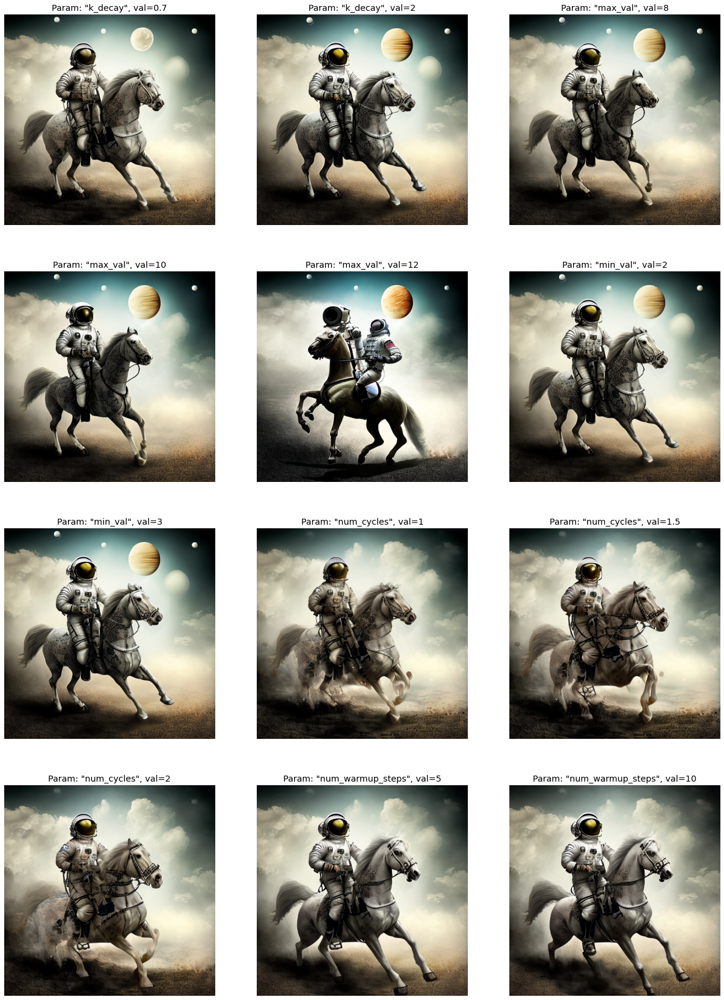

In [ ]:
#| echo: false
#| output: true
# display all images
image_grid(base_norm_cos_res['images'], title=base_norm_cos_res['titles'], rows=4, width=width, height=height)

## `T-Norm` results

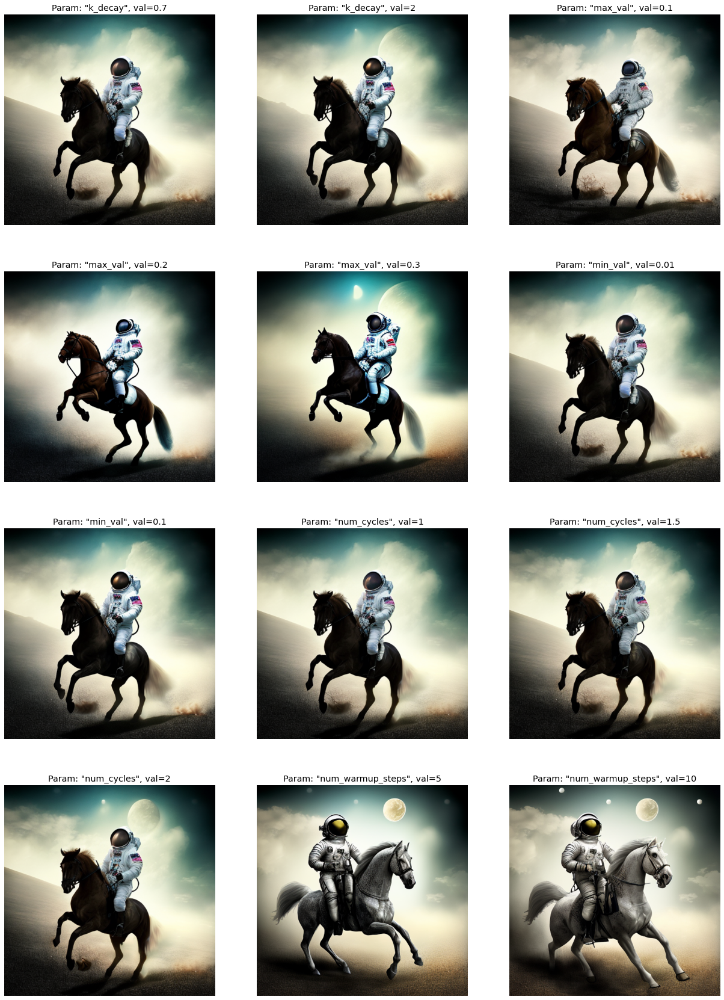

In [ ]:
#| echo: false
#| output: true
# display all images
image_grid(t_norm_cos_res['images'], title=t_norm_cos_res['titles'], rows=4, width=width, height=height)

## `FullNorm` results

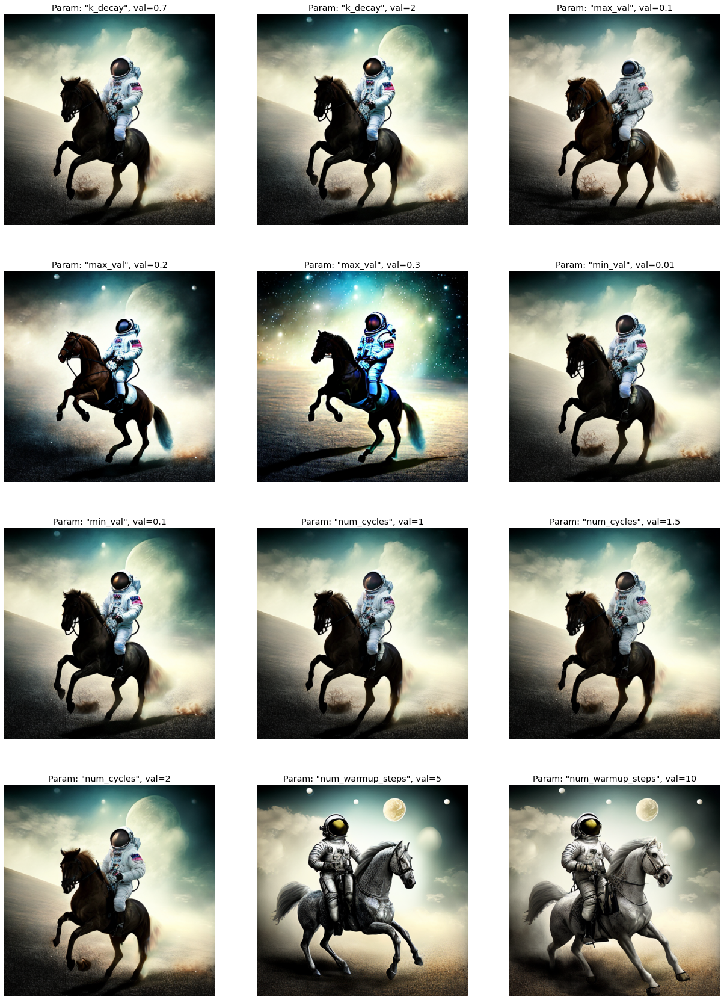

In [ ]:
#| echo: false
#| output: true
# display all images
image_grid(full_norm_cos_res['images'], title=full_norm_cos_res['titles'], rows=4, width=width, height=height)

## Analysis  

There are many images and parameter changes going on. 

Broadly speaking, across normalizations, the following schedules show the most promise:  

- Changing `k-decay`.  
- Allowing for some warmup steps.  
- Increasing the maximum value of $G$.  
- Allow the cosine to go through more cycles.  

The other changes either have negligible gains or actively corrupted the image.

# Conclusion

This notebook was Part 3 in a series on dynamic Classifier-free Guidance.  

It combined guidance normalizations and schedules to see if we could make even better images.  

We found a promising set of changes that seem to improve on the static, constant baseline.  

In Part 4, we will dig into some of the promising schedules to find more answers.   